<div align=right>
Dylan Clairmont<br>
Chunyang Zhang<br>
</div>

<h1 align=center>Word Cloud Visualization</h1>

<font color='darkblue'> <h2>Learning Objectives</h2> </font>

* Learn the basics of visualization using: wordcloud, including various parameters
* Apply the visualization principles and guidelines to k-pop reddit data 
* Understand why wordclouds are incomplete and typically need to be suplemented with additional visualization(s)

Word Cloud's are great visualization tools for working with text data. At a high-level, word clouds create a pretty visualization of top text terms in a certain text corpus, with the larger the word, the more frequent it appears in the corpus. Word Cloud's are a great first step to get a visual idea of what your text data looks like before using more advanced computational methods. 

However, as we touched on in class, Word Cloud's alone are NOT enough! Often, they need to be accompanied by some sort of other visualization, such as a bar graph with top term frequency. This way, we have more of a quantiative understanding of the data, rather than simply replying on the visual word cloud to explain the data to us. 

In this exercise, we will be working with text data that I scraped from Reddit using Reddit's API. We will be creating Word Cloud visualizations for posts from two subreddit communities - Blackpink and Newjeans, two popular k-pop groups. Blackpink is a very established, popular group in the k-pop scene, with a lot of songs and experience. Newjeans, in comparison, is far newer and less established, however they have grown a lot of popularity recently as a new, "gen-z" type of k-pop group. Do we see different terms come up for each group? Anything about age, newness, establishment, or even cross-references of the groups in the different subreddit communities? Let's find out! 

In [1]:
#import packages
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator #wordcloud includes its own stopwords function, which we will use to remove stopwords
import matplotlib.pyplot as plt #to visualize our wordcloud 
import pandas as pd #to read in the csv files 
import numpy as np
from PIL import Image
%matplotlib inline

In [2]:
#read in the data
blackpink = pd.read_csv('blackpink.csv') 
newjeans = pd.read_csv('newjeans.csv')

In [3]:
#visualize our data
print(blackpink.head())
print(newjeans.head())

   Unnamed: 0  subreddit                                              title  \
0           0  BlackPink  [MEXICO] If I only needed to buy 2 tickets wit...   
1           1  BlackPink  230207 Blackpink wins Group Of The Year and Mu...   
2           2  BlackPink  230207 Margaret__Zhang Weibo Update w/ Rosé, D...   
3           3  BlackPink                230207 Central Cee posted Blackpink   
4           4  BlackPink  Is being distinguishable one of the factors th...   

                                            selftext  upvote_ratio  \
0                                                NaN          1.00   
1                                                NaN          1.00   
2                                                NaN          0.96   
3                                                NaN          0.98   
4  Before Blackpink, I wasn't really interested i...          0.93   

                                                text  
0  [MEXICO] If I only needed to buy 2 tickets wit

In [4]:
#visualize the column of text data that we want to use for the wordcloud 
print(blackpink.text)
print(newjeans.text)

0      [MEXICO] If I only needed to buy 2 tickets wit...
1      230207 Blackpink wins Group Of The Year and Mu...
2      230207 Margaret__Zhang Weibo Update w/ Rosé, D...
3                   230207 Central Cee posted Blackpink 
4      Is being distinguishable one of the factors th...
                             ...                        
984    221121 Bryanboy Twitter update w/ Jisoo &amp; ...
985                     221121 Rosé for Vogue Hong Kong 
986    221121 Sabrina Carpenter reveals her dream col...
987    221120 BLACKPINK w/ Paul Tollet (organizer and...
988    221120 destinyrogers IG Story Update w/ Lisa &...
Name: text, Length: 989, dtype: object
0      230208 NewJeans currently has the highest mont...
1      230207 Billboard Hot 100: #77(+2) OMG, NewJean...
2        230207 [Light Jeans] MUSINSA Photoshoot Behind 
3      Newjeans Danielle is severely underrated and u...
4      why is it called "ditto"? like what does the w...
                             ...                 

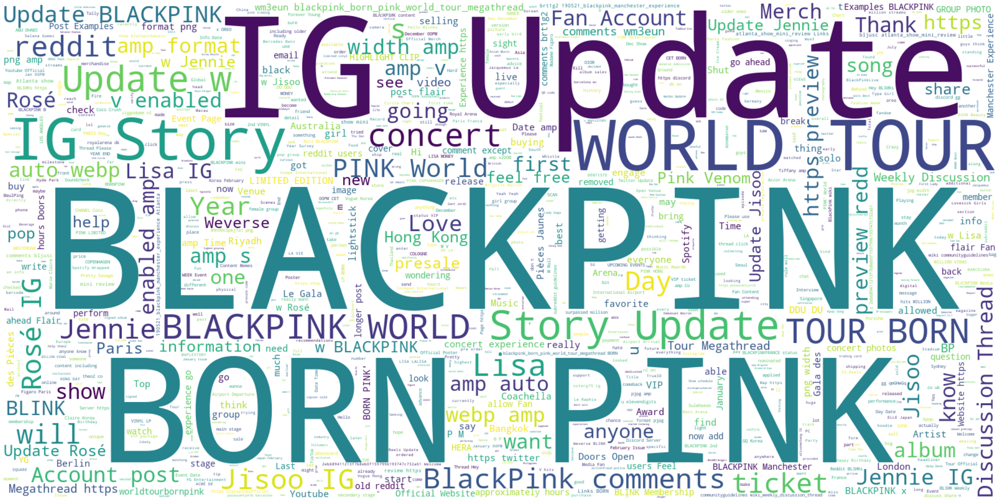

In [5]:
#Word cloud for Blackpink
cloud = WordCloud(max_words = 1800, 
                  width = 1600, 
                  height = 800,
                  stopwords = STOPWORDS, 
                  background_color = "white").generate(" ".join(blackpink.text))
plt.figure(figsize=(40, 30))
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

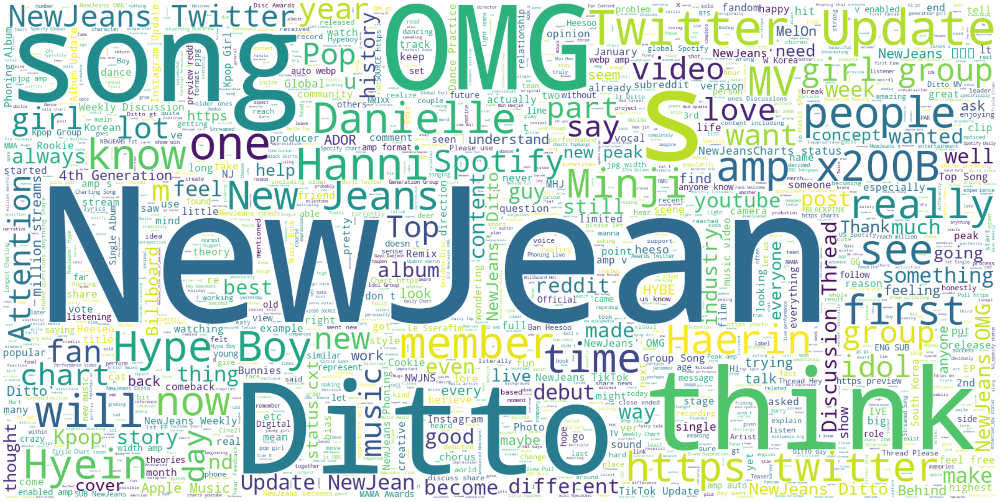

In [6]:
#Word cloud for NewJeans
cloud = WordCloud(max_words = 1800, 
                  width = 1600, 
                  height = 800,
                  stopwords = STOPWORDS, 
                  background_color = "white").generate(" ".join(newjeans.text))
plt.figure(figsize=(40, 30))
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

play around with some optional arguments of the WordCloud, for example, background_color

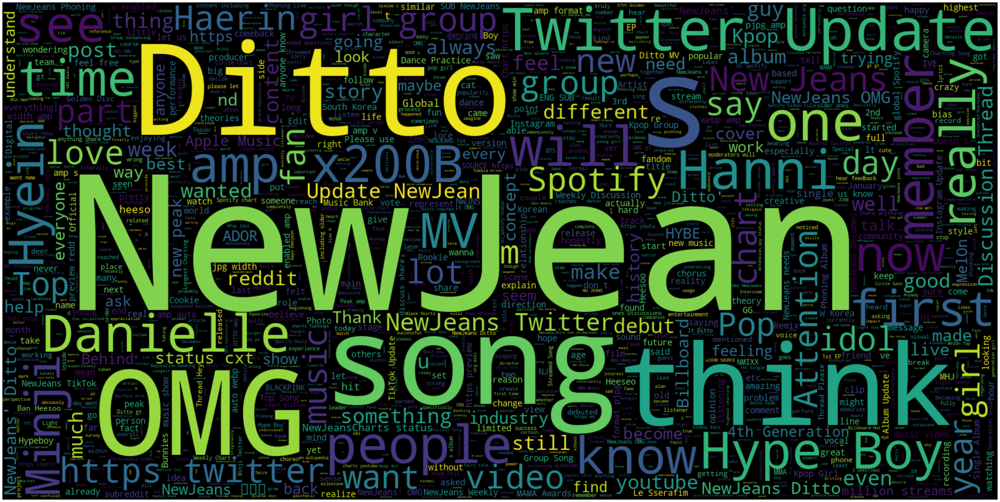

In [7]:
#try changing the background color to black 
cloud = WordCloud(max_words = 1800, 
                  width = 1600, 
                  height = 800,
                  stopwords = STOPWORDS, 
                  background_color = "black").generate(" ".join(newjeans.text))
plt.figure(figsize=(40, 30))
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

If you want to save the image, WordCloud provides a function to_file

In [19]:
wordcloud.to_file("/Users/chunyangzhang/Desktop/macs30112/localcourse-materials/lectures/week6/hw4/first_review.png")

We will show in the following how we can create word clouds with special shapes. We will use the shape of the dove from the following picture:

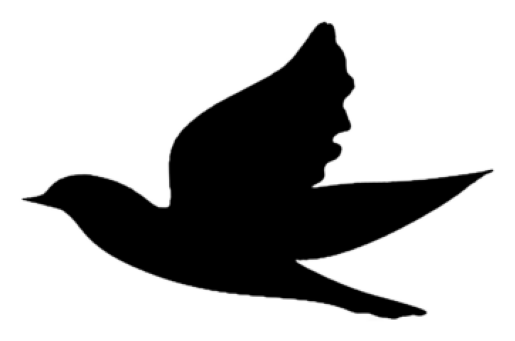

In [9]:
dove_mask = np.array(Image.open("/Users/chunyangzhang/Desktop/macs30112/localcourse-materials/lectures/week6/hw4/doveshape.png"))
#dove_mask[230:250, 240:250]
plt.imshow(dove_mask)
plt.axis("off")
plt.show()

If the parameter repeat is set to True the words and phrases will be repeated until max_words (default 200) or min_font_size (default 4) is reached.

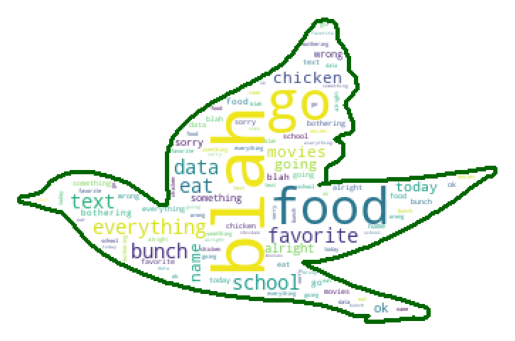

In [13]:
wordcloud = WordCloud(background_color="white", 
                      mask=dove_mask,
                      contour_width=3, 
                      repeat=True,
                      min_font_size=3,
                      contour_color='darkgreen')

# Generate a wordcloud
wordcloud.generate(string)

# show
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

Creating Wordcloud Following a Color Pattern

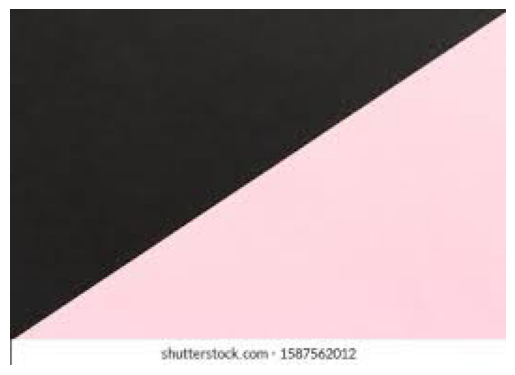

In [22]:
bp_color = np.array(Image.open("bp.jpeg"))
plt.imshow(bp_color)
plt.axis("off")
plt.show()

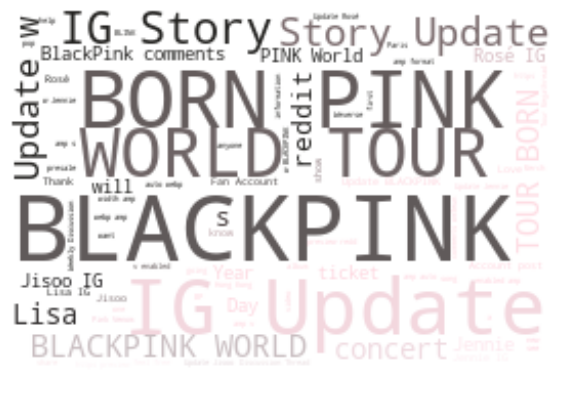

In [21]:
# Generate a word cloud image
mask = np.array(Image.open("bp.jpeg"))
wordcloud_usa = WordCloud(stopwords=STOPWORDS, background_color="white", mode="RGBA", max_words=1000, mask=mask).generate(" ".join(blackpink.text))

# create coloring from image
image_colors = ImageColorGenerator(mask)
plt.figure(figsize=[7,7])
plt.imshow(wordcloud_usa.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")

plt.show()

We have left additional exercises for you all to try at home! You can also play around with your own data! Try it yourself! 

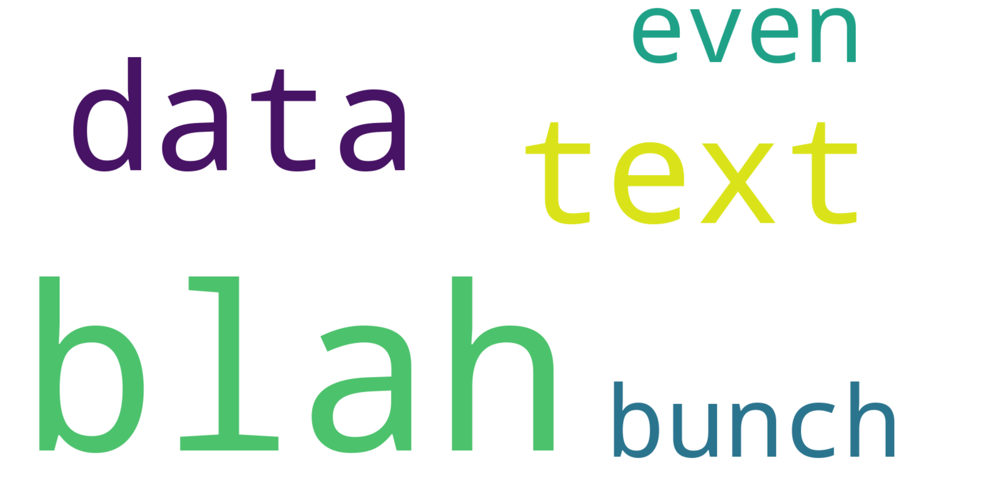

In [8]:
#for example, you can put whatever sentences you want in this list, and it'll combine all text together and find most common words 
list_of_strings = ['here is a bunch of text data blah blah blah blah blah blah blah blah blah blah', 'here is more text data', 'here is even more text data']

#Word cloud for List of Strings (example)
cloud = WordCloud(max_words = 1800, 
                  width = 1600, 
                  height = 800,
                  stopwords = STOPWORDS, 
                  background_color = "white").generate(" ".join(list_of_strings))
plt.figure(figsize=(40, 30))
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

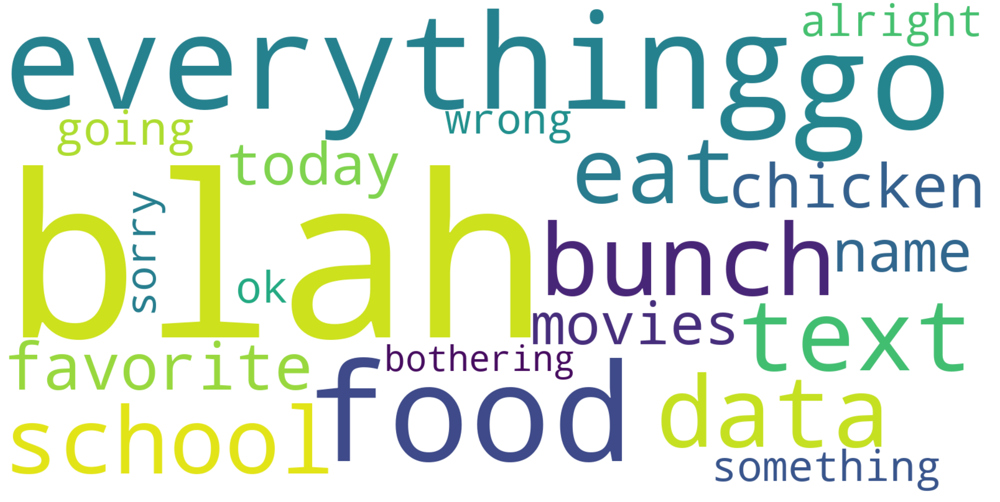

In [9]:
#alternatively, you can input your text data as one long string to start, and then plug it into the wordcloud generator
string = 'here is a bunch of text data blah blah blah blah blah blah blah blah blah blah I like to go to school and eat food my favorite food is chicken I like to go to the movies what do you like to do what is your name what are you doing today how is everything going are you doing alright is everything ok is something wrong sorry for bothering'

#Word cloud for String (example)
cloud = WordCloud(max_words = 1800, 
                  width = 1600, 
                  height = 800,
                  stopwords = STOPWORDS, 
                  background_color = "white").generate(string)
plt.figure(figsize=(40, 30))
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()